Aims-vcr


In [1]:
!pip install -q git+https://github.com/huggingface/transformers accelerate qwen-vl-utils bitsandbytes

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.9/40.9 MB 18.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.5/35.5 MB 14.7 MB/s eta 0:00:00


In [2]:
import torch

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

PyTorch: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [3]:
import torch
from transformers import Qwen2_5_VLForConditionalGeneration, AutoProcessor, BitsAndBytesConfig

model_name = "Qwen/Qwen2.5-VL-3B-Instruct"


quantization_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype=torch.float16,
)

model = Qwen2_5_VLForConditionalGeneration.from_pretrained(
    model_name,
    quantization_config=quantization_config,
    device_map="auto",
)

processor = AutoProcessor.from_pretrained(model_name)

print("Model loaded!")

config.json:   0%|          | 0.00/1.37k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/65.4k [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/824 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/216 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/1.05k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/5.70k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

Model loaded!


In [4]:
from PIL import Image
import requests
from io import BytesIO

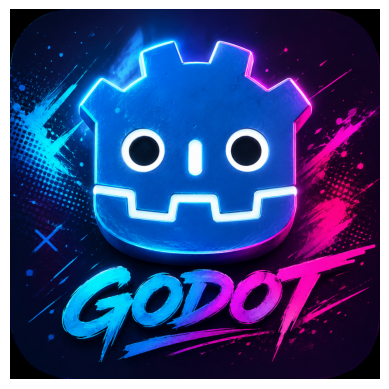

In [5]:
from PIL import Image
import matplotlib.pyplot as plt

image = Image.open("/content/godot.png").convert("RGB")

plt.imshow(image)
plt.axis("off");

In [6]:
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": image,
            },
            {
                "type": "text",
                "text": "Describe what you see in this image.",
            },
        ],
    }
]

In [7]:
#Converting into a format qwen should understand
text = processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)

#Add generation prompt means the user prompt is finsihed and now its qwen's turn to respond

In [8]:
inputs = processor(
    text=[text],
    images=[image],
    padding=True,
    return_tensors="pt",
)

In [9]:
print(inputs.keys())

KeysView({'input_ids': tensor([[151644,   8948,    198,  ..., 151644,  77091,    198]]), 'attention_mask': tensor([[1, 1, 1,  ..., 1, 1, 1]]), 'mm_token_type_ids': tensor([[0, 0, 0,  ..., 0, 0, 0]]), 'pixel_values': tensor([[-1.7923, -1.7923, -1.7923,  ..., -1.4802, -1.4802, -1.4802],
        [-1.7923, -1.7923, -1.7923,  ..., -1.4802, -1.4802, -1.4802],
        [-1.7923, -1.7923, -1.7923,  ..., -1.4802, -1.4802, -1.4802],
        ...,
        [-1.7923, -1.7923, -1.7923,  ..., -1.4802, -1.4802, -1.4802],
        [-1.7923, -1.7923, -1.7923,  ..., -1.4802, -1.4802, -1.4802],
        [-1.7923, -1.7923, -1.7923,  ..., -1.4802, -1.4802, -1.4660]]), 'image_grid_thw': tensor([[ 1, 90, 90]])})


In [10]:
inputs = inputs.to(model.device)

In [11]:
generated_ids = model.generate(
    **inputs,
    max_new_tokens=150
)

In [12]:
output = processor.batch_decode(
    generated_ids,
    skip_special_tokens=True
)

print(output[0])

system
You are a helpful assistant.
user
Describe what you see in this image.
assistant
The image features a stylized logo with the text "GODOT." The logo consists of a gear-like shape with two circular eyes and a smiling mouth, giving it a friendly appearance. The gear is illuminated with neon blue and pink lights, creating a glowing effect. The background includes abstract patterns and splashes of color, predominantly in shades of blue, and pink, adding to the vibrant and modern aesthetic of the logo. The word "GODOT" is written in large, bold letters that also glow with neon colors, matching the overall theme of the logo.


In [13]:
from datasets import load_dataset

dataset = load_dataset(
    "Rowan/vcr",
    name="questions",
    split="train",
    streaming=True
)

README.md:   0%|          | 0.00/1.80k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/59 [00:00<?, ?it/s]

In [14]:
sample = next(iter(dataset))

print(sample.keys())

dict_keys(['movie', 'objects', 'interesting_scores', 'answer_likelihood', 'img_fn', 'metadata_fn', 'answer_orig', 'question_orig', 'rationale_orig', 'question_tokens', 'answer_choice_tokens', 'answer_label', 'answer_match_iter', 'answer_sources', 'rationale_choice_tokens', 'rationale_sources', 'rationale_match_iter', 'rationale_label', 'source_zip_crc_mismatch', 'img_id', 'question_number', 'annot_id', 'match_fold', 'match_index', 'question_text', 'answer_choice_texts', 'rationale_choice_texts'])


In [15]:
for key, value in sample.items():
    print("\n---", key, "---")
    print(value)


--- movie ---
3015_CHARLIE_ST_CLOUD

--- objects ---
['person', 'person', 'person', 'car']

--- interesting_scores ---
[0]

--- answer_likelihood ---
possible

--- img_fn ---
lsmdc_3015_CHARLIE_ST_CLOUD/3015_CHARLIE_ST_CLOUD_00.23.57.935-00.24.00.783@0.jpg

--- metadata_fn ---
lsmdc_3015_CHARLIE_ST_CLOUD/3015_CHARLIE_ST_CLOUD_00.23.57.935-00.24.00.783@0.json

--- answer_orig ---
No she does not

--- question_orig ---
Does 3 feel comfortable?

--- rationale_orig ---
She is standing with her arms crossed and looks disturbed

--- question_tokens ---
[{'kind': 'text', 'text': 'Does', 'object_indices': []}, {'kind': 'objects', 'text': None, 'object_indices': [2]}, {'kind': 'text', 'text': 'feel', 'object_indices': []}, {'kind': 'text', 'text': 'comfortable', 'object_indices': []}, {'kind': 'text', 'text': '?', 'object_indices': []}]

--- answer_choice_tokens ---
[[{'kind': 'text', 'text': 'Yes', 'object_indices': []}, {'kind': 'text', 'text': 'because', 'object_indices': []}, {'kind': 'tex

In [16]:
image_dataset = load_dataset(
    "Rowan/vcr",
    name="image_examples",
    split="train",
    streaming=True
)

image_sample = next(iter(image_dataset))

print(image_sample.keys())

for key, value in image_sample.items():
    print("\n---", key, "---")
    print(type(value))
    print(value if key != "image" else value)

Resolving data files:   0%|          | 0/59 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/59 [00:00<?, ?it/s]

dict_keys(['image', 'img_fn', 'metadata_fn', 'movie', 'objects', 'width', 'height', 'image_width', 'image_height', 'boxes', 'segms_json', 'question_count', 'source_zip_crc_mismatch', 'image_metadata_dimension_mismatch', 'annotations'])

--- image ---
<class 'PIL.JpegImagePlugin.JpegImageFile'>
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=1920x804 at 0x7E71A6EA9400>

--- img_fn ---
<class 'str'>
lsmdc_3015_CHARLIE_ST_CLOUD/3015_CHARLIE_ST_CLOUD_00.23.57.935-00.24.00.783@0.jpg

--- metadata_fn ---
<class 'str'>
lsmdc_3015_CHARLIE_ST_CLOUD/3015_CHARLIE_ST_CLOUD_00.23.57.935-00.24.00.783@0.json

--- movie ---
<class 'str'>
3015_CHARLIE_ST_CLOUD

--- objects ---
<class 'list'>
['person', 'person', 'person', 'car']

--- width ---
<class 'int'>
1920

--- height ---
<class 'int'>
804

--- image_width ---
<class 'int'>
1920

--- image_height ---
<class 'int'>
804

--- boxes ---
<class 'list'>
[[953.9031982421875, 139.72866821289062, 1471.0701904296875, 768.2879638671875, 0.99854326248

(1920, 1040)
(768, 416)


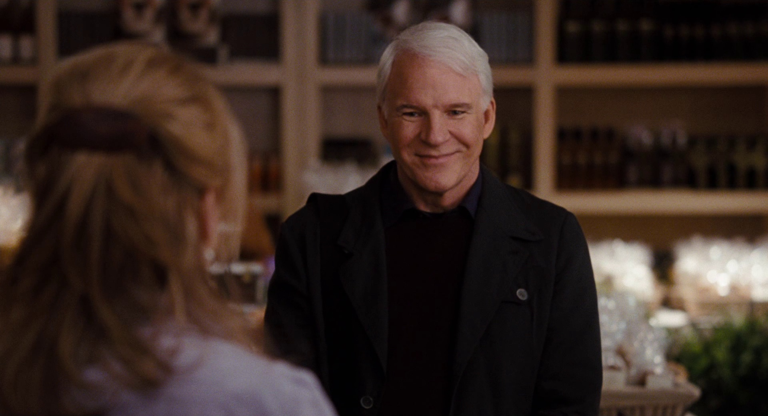

In [50]:
image = image_cache[samples[5]["img_fn"]]

print(image.size)

image.thumbnail((768, 768))

print(image.size)

display(image)

In [51]:
question = samples[5]["question_text"]
answers = samples[5]["answer_choice_texts"]

prompt = f"""
You are solving a Visual Commonsense Reasoning (VCR) multiple-choice question.

Question:
{question}

Answer choices:

A. {answers[0]}
B. {answers[1]}
C. {answers[2]}
D. {answers[3]}

Select the answer that is best supported by the image and question.

Respond with ONLY one letter: A, B, C, or D.
"""

# print(prompt)

In [52]:
# prompt = "Describe what you see in the image as a smart VCR model"

messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": image,
            },
            {
                "type": "text",
                "text": prompt,
            },
        ],
    }
]

In [53]:
text = processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)

inputs = processor(
    text=[text],
    images=[image],
    padding=True,
    return_tensors="pt",
)

inputs = inputs.to(model.device)

generated_ids = model.generate(
    **inputs,
    max_new_tokens=10
)

output = processor.batch_decode(
    generated_ids,
    skip_special_tokens=True
)

print("Model:", output[0])
print("Correct:", "ABCD"[sample["answer_label"]])

Model: system
You are a helpful assistant.
user

You are solving a Visual Commonsense Reasoning (VCR) multiple-choice question.

Question:
Where are [person0,person1]?

Answer choices:

A. [person0,person1] are in a basement.
B. They are in a workshop.
C. [person0,person1] are in the airport.
D. They are at a restaurant.

Select the answer that is best supported by the image and question.

Respond with ONLY one letter: A, B, C, or D.

assistant
D
Correct: C


In [54]:
predicted_answer = output[0].strip()

rationales = sample["rationale_choice_texts"]

rationale_prompt = f"""
You are solving the rationale-selection stage of a Visual Commonsense Reasoning (VCR) task.

Question:
{question}

The selected answer is:
{predicted_answer}

Choose the rationale that best explains why the selected answer is correct.

Rationale choices:

A. {rationales[0]}
B. {rationales[1]}
C. {rationales[2]}
D. {rationales[3]}

Respond with ONLY one letter: A, B, C, or D.
"""

print(rationale_prompt)


You are solving the rationale-selection stage of a Visual Commonsense Reasoning (VCR) task.

Question:
Where are [person0,person1]?

The selected answer is:
system
You are a helpful assistant.
user

You are solving a Visual Commonsense Reasoning (VCR) multiple-choice question.

Question:
Where are [person0,person1]?

Answer choices:

A. [person0,person1] are in a basement.
B. They are in a workshop.
C. [person0,person1] are in the airport.
D. They are at a restaurant.

Select the answer that is best supported by the image and question.

Respond with ONLY one letter: A, B, C, or D.

assistant
D

Choose the rationale that best explains why the selected answer is correct.

Rationale choices:

A. There is a folder on top of the water cooler, and they are using two hands to pour.
B. Their hands are clasped to the note and they look like they' re about to read its contents while [person1] hovers over them.
C. [person0] is opening a letter and looking at it intently as [person13,person4,pers

In [55]:
messages = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
                "image": image,
            },
            {
                "type": "text",
                "text": rationale_prompt,
            },
        ],
    }
]

text = processor.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)

inputs = processor(
    text=[text],
    images=[image],
    padding=True,
    return_tensors="pt",
).to(model.device)

generated_ids = model.generate(
    **inputs,
    max_new_tokens=5
)

rationale_output = processor.batch_decode(
    generated_ids,
    skip_special_tokens=True
)

print("Model rationale:", rationale_output[0])
print("Correct rationale:", "ABCD"[sample["rationale_label"]])

Model rationale: system
You are a helpful assistant.
user

You are solving the rationale-selection stage of a Visual Commonsense Reasoning (VCR) task.

Question:
Where are [person0,person1]?

The selected answer is:
system
You are a helpful assistant.
user

You are solving a Visual Commonsense Reasoning (VCR) multiple-choice question.

Question:
Where are [person0,person1]?

Answer choices:

A. [person0,person1] are in a basement.
B. They are in a workshop.
C. [person0,person1] are in the airport.
D. They are at a restaurant.

Select the answer that is best supported by the image and question.

Respond with ONLY one letter: A, B, C, or D.

assistant
D

Choose the rationale that best explains why the selected answer is correct.

Rationale choices:

A. There is a folder on top of the water cooler, and they are using two hands to pour.
B. Their hands are clasped to the note and they look like they' re about to read its contents while [person1] hovers over them.
C. [person0] is opening a l

In [56]:
def get_image_for_sample(sample, image_dataset):
    target = sample["img_fn"]

    for img_sample in image_dataset:
        if img_sample["img_fn"] == target:
            return img_sample["image"]

    raise ValueError(f"Image not found: {target}")

In [57]:
question_iter = iter(dataset)

samples = []

for _ in range(10):
    samples.append(next(question_iter))

print(len(samples))

10


In [42]:
needed_images = set(sample["img_fn"] for sample in samples)

print(len(needed_images))

4


In [47]:
image_cache = {}

for img_sample in image_dataset:
    img_fn = img_sample["img_fn"]

    if img_fn in needed_images:
        image_cache[img_fn] = img_sample["image"]

        print("Loaded:", img_fn)

    if len(image_cache) == len(needed_images):
        break

Loaded: lsmdc_3015_CHARLIE_ST_CLOUD/3015_CHARLIE_ST_CLOUD_00.23.57.935-00.24.00.783@0.jpg
Loaded: lsmdc_3038_ITS_COMPLICATED/3038_ITS_COMPLICATED_00.08.14.616-00.08.17.313@0.jpg
Loaded: lsmdc_1051_Harry_Potter_and_the_goblet_of_fire/1051_Harry_Potter_and_the_goblet_of_fire_02.10.26.133-02.10.30.224@0.jpg
Loaded: lsmdc_1051_Harry_Potter_and_the_goblet_of_fire/1051_Harry_Potter_and_the_goblet_of_fire_02.21.22.023-02.21.30.292@2.jpg


Does [person2] feel comfortable?


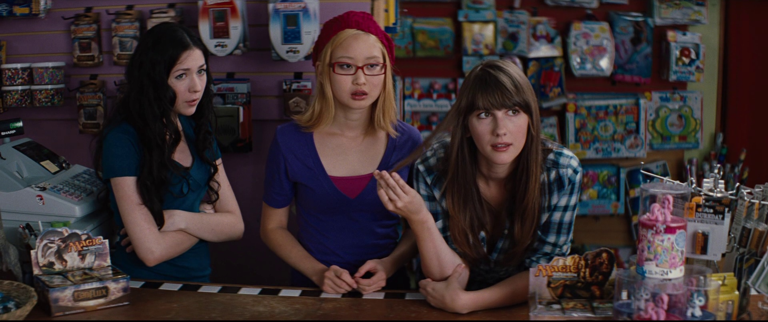

Do [person1,person2] work together?


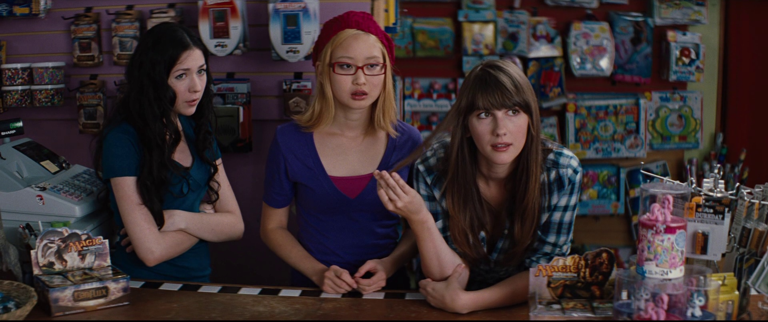

Do [person0,person1] know each other?


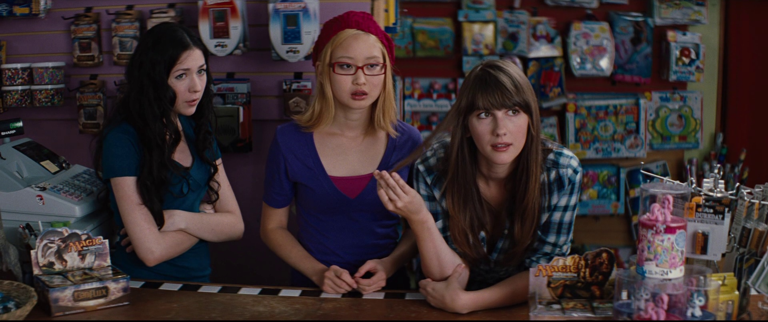

What is [person0] feeling right now?


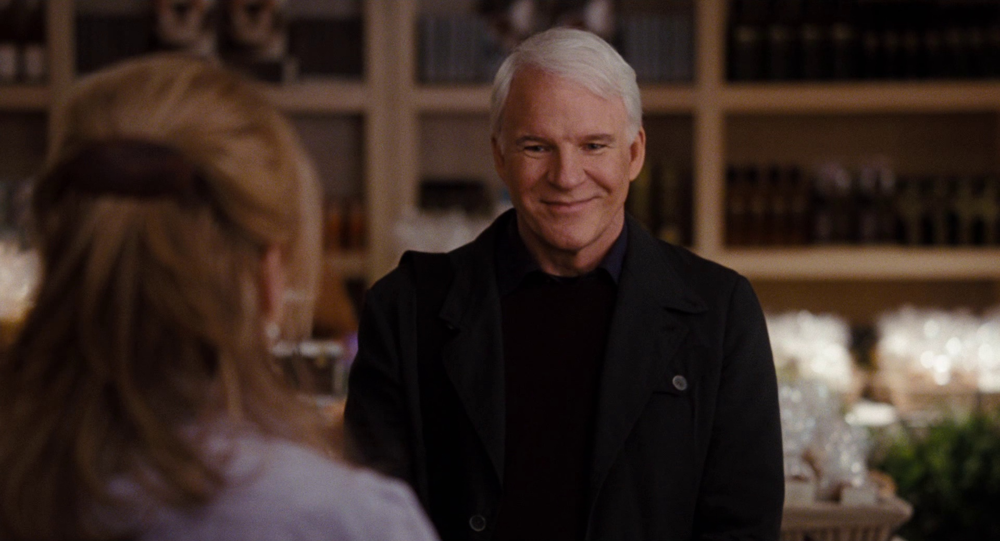

Why is [person0] smiling at [person1]?


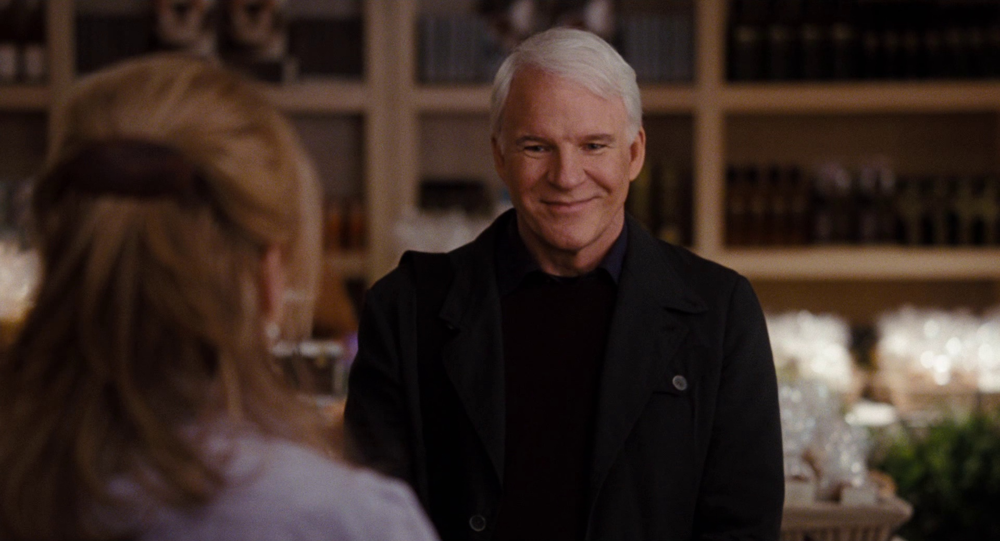

Where are [person0,person1]?


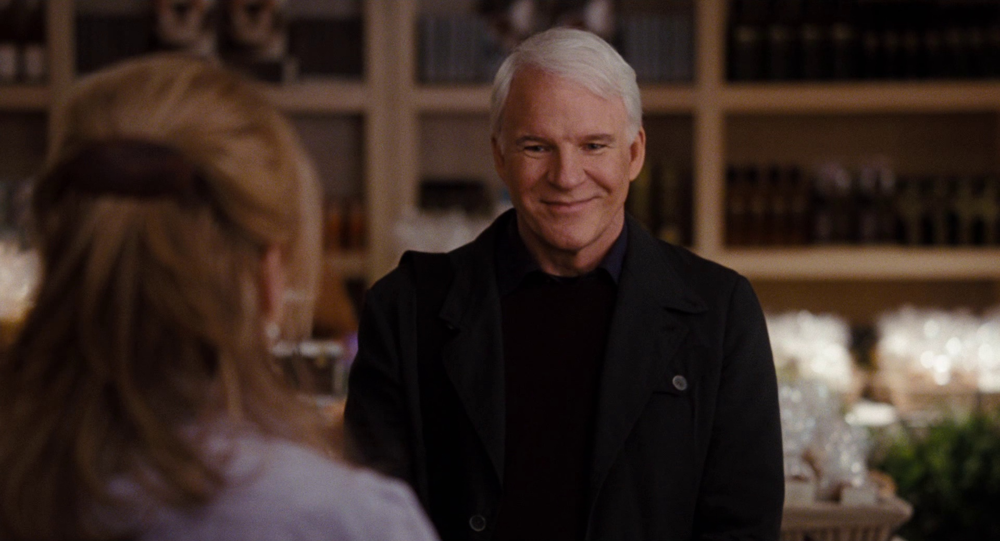

Why is [person8] laying down?


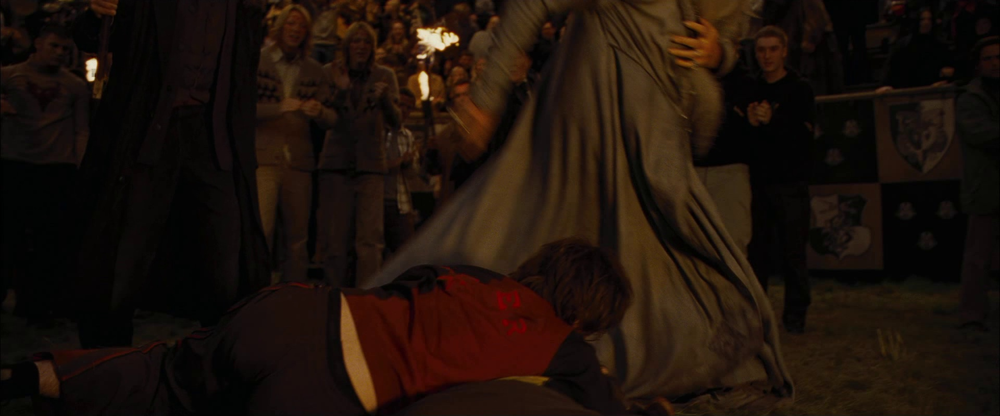

What is [person3] doing?


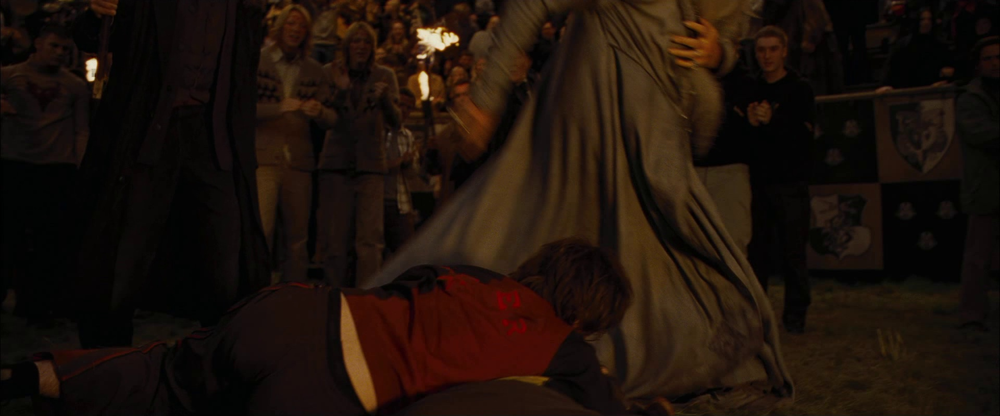

Was [person8] involved in the whole fight?


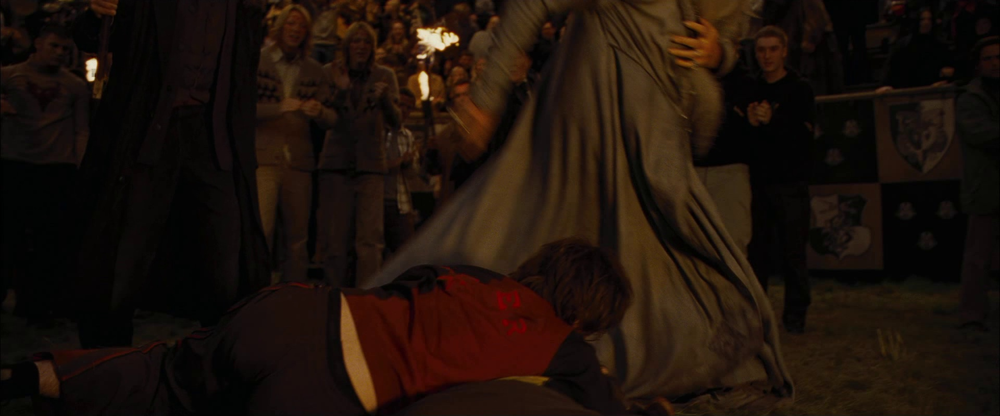

What is [person0] about to do?


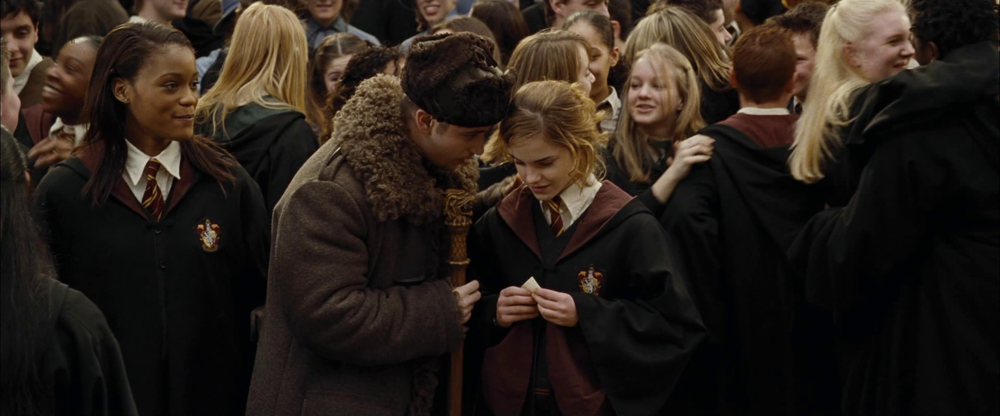

In [49]:
for sample in samples:

    image = image_cache[sample["img_fn"]]

    print(sample["question_text"])
    display(image)